In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import silhouette_score

import importlib

import utility_functions as uf

In [2]:
year = 2023
mode = "individual"


In [5]:
df_cs = pd.read_csv(uf.PATH+f"df_country_subfield/{mode}_{year}.csv", index_col=0)

In [157]:
df_cf = (
    pd.read_csv(uf.PATH+f"df_country_subfield/{mode}_{year}.csv", index_col=0)
    .T
    .merge(uf.df_topics[["subfield_id", "field_id"]].drop_duplicates().assign(subfield_str=lambda df: df.subfield_id.astype(str)).set_index("subfield_str"),
           left_index=True, right_index=True)
    .drop(columns=["subfield_id"])
    .groupby("field_id")
    .sum()
    .T
)
df_cf

field_id,11,12,13,14,15,16,17,18,19,20,...,27,28,29,30,31,32,33,34,35,36
AD,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,1.0
AE,100.0,106.0,133.0,264.0,25.0,43.0,709.0,81.0,57.0,123.0,...,775.0,67.0,10.0,8.0,69.0,184.0,562.0,1.0,54.0,126.0
AF,29.0,31.0,9.0,41.0,0.0,1.0,30.0,1.0,1.0,8.0,...,81.0,1.0,2.0,1.0,1.0,20.0,183.0,0.0,7.0,15.0
AG,0.0,0.0,9.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,77.0,3.0,1.0,3.0,0.0,2.0,2.0,0.0,5.0,5.0
AL,39.0,59.0,10.0,70.0,2.0,0.0,52.0,14.0,13.0,61.0,...,141.0,2.0,2.0,1.0,5.0,32.0,281.0,0.0,7.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WS,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0
YE,31.0,36.0,16.0,35.0,1.0,15.0,78.0,17.0,9.0,48.0,...,276.0,2.0,11.0,16.0,24.0,17.0,108.0,0.0,21.0,43.0
ZA,1174.0,832.0,572.0,1156.0,39.0,184.0,959.0,304.0,193.0,754.0,...,2603.0,105.0,138.0,43.0,275.0,792.0,4502.0,28.0,39.0,683.0
ZM,46.0,15.0,14.0,86.0,1.0,1.0,34.0,15.0,2.0,55.0,...,121.0,0.0,5.0,1.0,4.0,21.0,137.0,0.0,1.0,35.0


In [158]:
labels = ["bottom", "middle_lower", "middle_upper", "top"]
labels = [1, 2, 3, 4]

In [159]:
def get_mapping(row, quantiles_pct, labels):
    quantiles = row.quantile(quantiles_pct)
    return pd.cut(row, bins=quantiles, labels=labels)

In [160]:
def get_mapping(row, quantiles_pct, labels):
    quantiles = row.quantile(quantiles_pct).reset_index(drop=True).drop_duplicates()
    labels_tmp = [labels[i-1] for i in quantiles.iloc[:-1].index]
    if len(quantiles.index) == 2:
        labels_tmp = [labels[2]]
    return pd.cut(row, bins=quantiles, labels=labels_tmp)

df_im = (
    df_cf
    .apply(get_mapping, quantiles_pct=[0, 0.15, 0.5, 0.85, 1], labels=labels, axis=1)
)

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/pandas/core/arrays/categorical.py:1692: RuntimeWarning:

invalid value encountered in cast



In [162]:
x_labels = df_im.columns
y_labels = df_cs.sum(axis=1).sort_values(ascending=False).index
uf.plotly_heatmap(
    df_im.loc[y_labels],
    x_labels=x_labels,
    y_labels=y_labels,
    title="Individual discrete interest",
    colorscale="non",
    y_type="country",
    # x_type="subfield"
)

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

divide by zero encountered in matmul

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

overflow encountered in matmul

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

invalid value encountered in matmul

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

divide by zero encountered in matmul

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

overflow encountered in matmul

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

invalid value encountered in matmul



Score:  0.13225117831004132


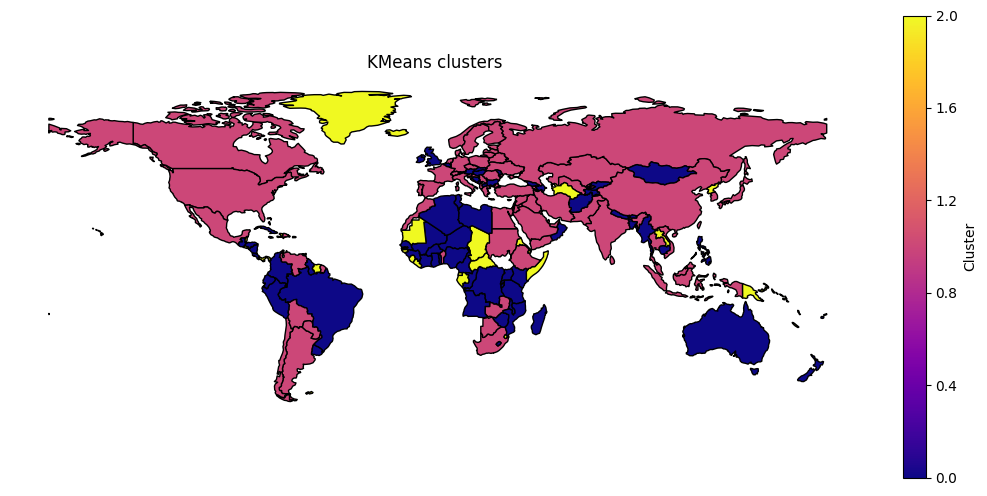

In [163]:
from sklearn.cluster import KMeans

# Fake data
X = df_im.fillna(0).values

# Fit KMeans
kmeans = KMeans(
    n_clusters=3,
    random_state=42,
    n_init=20
)

labels = kmeans.fit_predict(X)

score = silhouette_score(X, labels, metric="euclidean")
print("Score: ", score)

df_map = (
    pd.DataFrame(index=df_im.index)
    .assign(labels=labels)
    .merge(uf.df_country[["alpha-2", "alpha-3"]], left_index=True, right_on="alpha-2")
)

_, _ = uf.plot_map_continuous(
    df_map, column="labels", title="KMeans clusters", legend="Cluster",
)

In [164]:
df_dist_cosine = uf.get_cosine_distances(df_im.fillna(0))

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

divide by zero encountered in matmul

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

overflow encountered in matmul

/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning:

invalid value encountered in matmul



In [165]:
x_labels = df_cs.sum(axis=1).sort_values(ascending=False).index
y_labels = df_cs.sum(axis=1).sort_values(ascending=False).index
uf.plotly_heatmap(
    df_dist_cosine.loc[y_labels, x_labels],
    x_labels=x_labels,
    y_labels=y_labels,
    title="Individual discrete interest cosine distances",
    colorscale="non",
    y_type="country",
    x_type="country"
)

0.17313638787685706


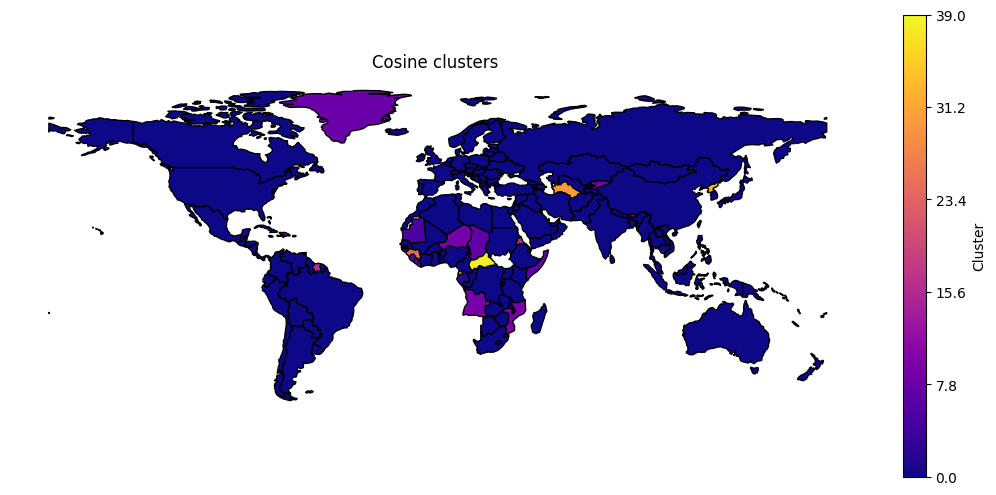

In [181]:
from sklearn.cluster import AgglomerativeClustering

D = df_dist_cosine.fillna(0).values

model = AgglomerativeClustering(n_clusters=40, metric='precomputed', linkage='average')

labels = model.fit_predict(D)

score = silhouette_score(D, labels, metric="precomputed")
print(score)

df_map = (
    pd.DataFrame(index=df_im.index)
    .assign(labels=labels)
    .merge(uf.df_country[["alpha-2", "alpha-3"]], left_index=True, right_on="alpha-2")
)

_, _ = uf.plot_map_continuous(
    df_map, column="labels", title="Cosine clusters", legend="Cluster",
)

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_4565/3071056403.py:6: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



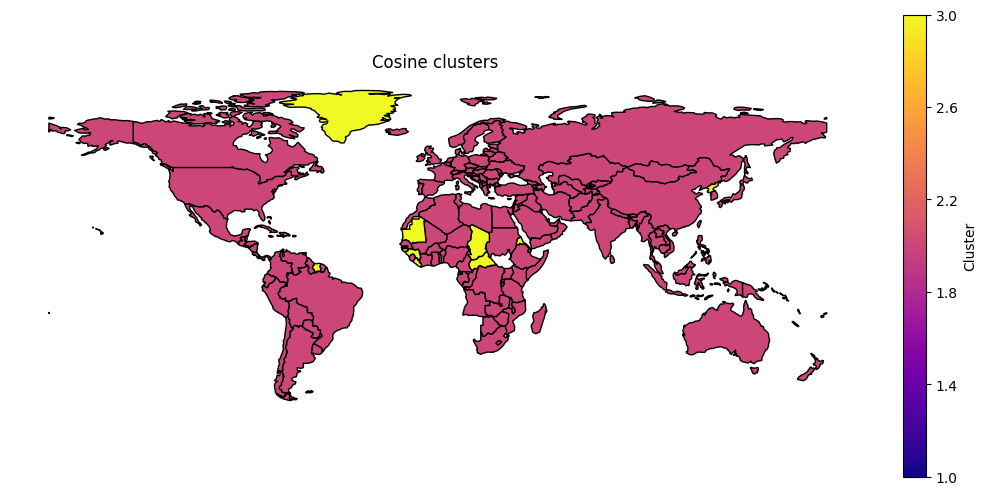

In [166]:
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

condensed_D = df_dist_cosine.values

Z = linkage(condensed_D, method='average')

labels1 = fcluster(Z, t=3, criterion='maxclust')

# score = silhouette_score(df_dist_cosine.values, labels1, metric="precomputed")
# score
df_map = (
    pd.DataFrame(index=df_im.index)
    .assign(labels=labels1)
    .merge(uf.df_country[["alpha-2", "alpha-3"]], left_index=True, right_on="alpha-2")
)

_, _ = uf.plot_map_continuous(
    df_map, column="labels", title="Cosine clusters", legend="Cluster",
)

In [167]:
def get_nan_euclidian_distances(df):
    countries = df.index
    dist_array = np.full((len(countries), len(countries)), np.nan)
    for i, country1 in enumerate(countries):
        for j in range(i, len(countries)):
            country2 = countries[j]
            if i != j:
                idx_list = df.loc[country1].notna() & df.loc[country2].notna()
                if idx_list.sum() == 0:
                    dist_array[i, j] = dist_array[j, i] = 1
                else:
                    # print(idx_list)
                    max_dist = np.sqrt(( 3 ** 2 * np.ones((idx_list.sum(), 1))).sum())
                    # print(max_dist)
                    # print(df.loc[country1, idx_list])
                    # print(df.loc[country2, idx_list])
                    # print(df.loc[country1, idx_list] - df.loc[country2, idx_list])
                    dist = np.sqrt(((df.loc[country1, idx_list] - df.loc[country2, idx_list])**2).sum()) / max_dist
                    # print(dist)
                    dist_array[i, j] = dist_array[j, i] = dist
    return pd.DataFrame(dist_array, index=countries, columns=countries)

In [168]:
df_dist_euc = get_nan_euclidian_distances(df_im)

In [169]:
x_labels = df_cs.sum(axis=1).sort_values(ascending=False).index
y_labels = df_cs.sum(axis=1).sort_values(ascending=False).index
uf.plotly_heatmap(
    df_dist_euc.loc[y_labels, x_labels],
    x_labels=x_labels,
    y_labels=y_labels,
    title="Individual discrete interest cosine distances",
    colorscale="non",
    y_type="country",
    x_type="country"
)

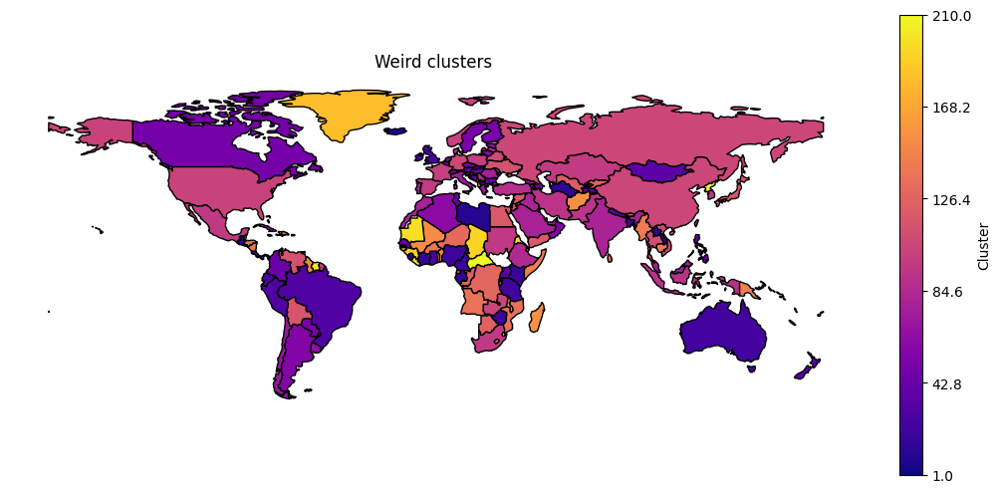

In [176]:
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.cluster import AgglomerativeClustering

D = df_dist_euc.fillna(0).values

model = AgglomerativeClustering(n_clusters=10, metric='precomputed', linkage='average')

labels = model.fit_predict(D)

score = silhouette_score(D, labels, metric="precomputed")
score

df_map = (
    pd.DataFrame(index=df_im.index)
    .assign(labels=labels1)
    .merge(uf.df_country[["alpha-2", "alpha-3"]], left_index=True, right_on="alpha-2")
)

_, _ = uf.plot_map_continuous(
    df_map, column="labels", title="Weird clusters", legend="Cluster",
)